In [1]:
%load_ext autoreload
%autoreload 2
from __future__ import division, print_function, absolute_import
import pickle
import glob
import os
import matplotlib.pyplot as plt
import sys
import numpy as np
from cycler import cycler
%matplotlib inline

from scipy import stats

In [2]:
t_titre = 35/2 #35
t_label = 25/2 #25
fig_width = 15/2 #15
#'black', 'dimgrey', 'dimgray', 'grey', 'gray', 'darkgrey', 'darkgray', ## 'silver', 'lightgrey', 'lightgray'
#'rosybrown','lightcoral', 'indianred', 'firebrick', 'brown', 'darkred', 'red'
colors = ['black', 'dimgrey', 'grey', 'darkgrey', 'rosybrown', 'indianred', 'firebrick', 'brown', 'darkred', 'red']

In [3]:
liste = []
for fname in glob.glob('data/*pkl'):
    a = fname.split('/')[1].split('.')[0].split('_')
    liste.append(a)
    print(a)

['pari', 'TN', '2017-11-08', '155132']
['enregistrement', 'AM', '2017-10-23', '100057']
['enregistrement', 'CS', '2017-10-03', '134421']
['enregistrement', 'RS', '2017-11-08', '094717']
['pari', 'FM', '2017-09-26', '143606']
['pari', 'LB', '2017-09-19', '152205']
['enregistrement', 'LB', '2017-09-20', '151043']
['pari', 'YK', '2017-11-06', '164857']
['pari', 'DC', '2017-09-26', '162348']
['pari', 'IP', '2017-09-26', '122431']
['enregistrement', 'OP', '2017-10-26', '121823']
['pari', 'AM', '2017-09-29', '123528']
['pari', 'BMC', '2017-09-25', '142503']
['pari', 'OP', '2017-10-24', '105728']
['enregistrement', 'IP', '2017-09-28', '115250']
['enregistrement', 'TN', '2017-11-08', '150410']
['enregistrement', 'BMC', '2017-09-26', '095637']
['pari', 'CS', '2017-09-28', '154353']
['enregistrement', 'DC', '2017-09-27', '161040']
['enregistrement', 'FM', '2017-10-03', '143803']
['pari', 'RS', '2017-11-07', '105527']


In [4]:
exp = []
for x in range(len(liste)) :
    if liste[x][0]=='pari' and liste[x][1] in ['AM','BMC','CS','DC','FM', 'IP', 'LB', 'OP', 'RS', 'TN'] : #['AM','BMC','CS','DC','FM','IP','LB'] :
        a = 'data/%s_%s_%s_%s.pkl'%(liste[x][0], liste[x][1],liste[x][2],liste[x][3])
        with open(a, 'rb') as fichier :
            b = pickle.load(fichier, encoding='latin1')
            exp.append(b)

In [5]:
param = []
for x in range(len(liste)) :
    if liste[x][0]=='pari' and liste[x][1] in ['AM','BMC','CS','DC','FM', 'IP', 'LB', 'OP', 'RS', 'TN'] : #['AM','BMC','CS','DC','FM','IP','LB'] :
        a = 'parametre/%s_param_Fit.pkl'%(liste[x][1])
        with open(a, 'rb') as fichier :
            b = pickle.load(fichier, encoding='latin1')
            param.append(b)

In [6]:
print((param[0]['moyenne'][0][10]))

-0.013691850292


In [7]:
print (param[0].keys())

dict_keys(['maxi', 'tau', 'v_anti', 'latence', 'start_anti', 'observer', 'moyenne'])


### - les premier essais après le switch

In [8]:
# liste de tout
full_proba = [[],[],[],[],[]]
full_bino = [[],[],[],[],[]]
full_results = [[],[],[],[],[]]
full_va = [[],[],[],[],[]]
full_start_a = [[],[],[],[],[]]
full_latence = [[],[],[],[],[]]
full_tau = [[],[],[],[],[]]
full_max = [[],[],[],[],[]]
full_mean = [[],[],[],[],[]]

# listes de tout par sujet
proba_sujet = [[],[],[],[],[]]
bino_sujet = [[],[],[],[],[]]
results_sujet = [[],[],[],[],[]]
va_sujet = [[],[],[],[],[]]
start_a_sujet = [[],[],[],[],[]]
latence_sujet = [[],[],[],[],[]]
tau_sujet = [[],[],[],[],[]]
max_sujet = [[],[],[],[],[]]
mean_sujet = [[],[],[],[],[]]

for x in range(len(exp)):

    N_trials = exp[x]['N_trials']
    N_blocks = exp[x]['N_blocks']
    
    p = exp[x]['p']
    results = (exp[x]['results']+1)/2
    v_anti = param[x]['v_anti']
    start_anti = param[x]['start_anti']
    latence = param[x]['latence']
    tau = param[x]['tau']
    maxi = param[x]['maxi']
    mean = param[x]['moyenne']
    
    liste_proba = [[],[],[],[],[]]
    liste_bino = [[],[],[],[],[]]
    liste_results = [[],[],[],[],[]]
    liste_va = [[],[],[],[],[]]
    liste_start_a = [[],[],[],[],[]]
    liste_latence = [[],[],[],[],[]]
    liste_tau = [[],[],[],[],[]]
    liste_max = [[],[],[],[],[]]
    liste_mean = [[],[],[],[],[]]
    
    badabada = [0, 1, 2, 3, 4]
    
    for block in range(N_blocks):
        
        switch = []
        for s in range(N_trials):
            if s in [0,50,100,150] :
                switch.append(s)
            if p[s, block, 2]==1 :
                switch.append(s)
        switch.append(N_trials)
        
        for s1 in range(len(switch)-1) :
            
            for a in badabada :

                for trial in np.arange(switch[s1]+5*a, switch[s1+1]) :
                    full_proba[a].append(p[trial, block, 1])
                    full_bino[a].append(p[trial, block, 0])
                    full_results[a].append(results[trial, block])
                    full_va[a].append(v_anti[block][trial])
                    full_start_a[a].append(start_anti[block][trial])
                    full_latence[a].append(latence[block][trial])
                    full_tau[a].append(tau[block][trial])
                    full_max[a].append(((p[trial, block, 0]*2)-1)*maxi[block][trial]+((latence[block][trial]-start_anti[block][trial])*(v_anti[block][trial]/1000)))
                    full_mean[a].append(mean[block][trial]) 

                    liste_proba[a].append(p[trial, block, 1])
                    liste_bino[a].append(p[trial, block, 0])
                    liste_results[a].append(results[trial, block])
                    liste_va[a].append(v_anti[block][trial])
                    liste_start_a[a].append(start_anti[block][trial])
                    liste_latence[a].append(latence[block][trial])
                    liste_tau[a].append(tau[block][trial])
                    liste_max[a].append(((p[trial, block, 0]*2)-1)*maxi[block][trial]+((latence[block][trial]-start_anti[block][trial])*(v_anti[block][trial]/1000)))
                    liste_mean[a].append(mean[block][trial])
                
                
    for b in range(len(liste_proba)) :                      
        proba_sujet[b].append(liste_proba[b])
        bino_sujet[b].append(liste_bino[b])
        results_sujet[b].append(liste_results[b])
        va_sujet[b].append(liste_va[b])
        start_a_sujet[b].append(liste_start_a[b])
        latence_sujet[b].append(liste_latence[b])
        tau_sujet[b].append(liste_tau[b])
        max_sujet[b].append(liste_max[b])
        mean_sujet[b].append(liste_mean[b])

In [9]:
print(switch)

[0, 17, 38, 50, 100, 150, 155, 190, 200]


In [10]:
nb_sujet = len(proba_sujet[0])
nb_suppression = len(proba_sujet)
liste_suppression = ['', '- 5', '- 10', '- 15', '- 20']

In [11]:
print(nb_sujet)

10


In [12]:
proba_g = []
proba_d = []
results_g = []
results_d = []
maxi_g = []
maxi_d = []
for a in range(nb_suppression) :
    proba_g.append([])
    proba_d.append([])
    results_g.append([])
    results_d.append([])
    maxi_g.append([])
    maxi_d.append([])
    for x in range(nb_sujet) :
        proba_g[a].append([])
        proba_d[a].append([])
        results_g[a].append([])
        results_d[a].append([])
        maxi_g[a].append([])
        maxi_d[a].append([])
        for trial in range(len(proba_sujet[a][x])) :
            if bino_sujet[a][x][trial]==1:
                proba_g[a][x].append(proba_sujet[a][x][trial])
                results_g[a][x].append(results_sujet[a][x][trial])
                maxi_g[a][x].append(max_sujet[a][x][trial])
                
            elif bino_sujet[a][x][trial]==0:
                proba_d[a][x].append(proba_sujet[a][x][trial])
                results_d[a][x].append(results_sujet[a][x][trial])
                maxi_d[a][x].append(max_sujet[a][x][trial])

In [13]:
def plot_sujet(proba, para,
               titre, y_1, y_2, x_label, y_label,
               liste_suppression=liste_suppression,
               nb_sujet=nb_sujet, colors=colors,
               deux_lignes_reg=False, nan=False) :

    fig, axs = plt.subplots(nb_suppression, nb_sujet, figsize=(fig_width*nb_sujet, (fig_width*nb_suppression)/1.6180))

    plt.subplots_adjust(hspace=0.4)
    fig.suptitle(titre, fontsize=t_titre*2)

    for x, color in enumerate(colors[:nb_sujet]):

        for a, nom in enumerate(liste_suppression) :

            pro = proba[a][x]
            par = para[a][x]
            axs[a][x].scatter(pro, par, c=color, alpha=0.5, linewidths=0)


            if deux_lignes_reg is True :
                proba_0 = []
                proba_1 = []
                para_0 = []
                para_1 = []

                for trial in range(len(pro)) :
                    if pro[trial] < 0.5 :
                        proba_0.append(pro[trial])
                        para_0.append(par[trial])
                    else :
                        proba_1.append(pro[trial])
                        para_1.append(par[trial])

                slope, intercept, r_value, p_value, std_err = stats.linregress(pro, par)
                x_test = np.linspace(np.min(pro), np.max(pro), 100)
                fitLine = slope * x_test + intercept
                axs[a][x].plot(x_test, fitLine, c='dimgrey', linewidth=2)
                axs[a][x].text(0.7,(y_1+3*(y_2-y_1)/10), 'r = %0.3f'%(r_value), fontsize=t_label)

                slope, intercept, r_value, p_value, std_err = stats.linregress(proba_0, para_0)
                x_test = np.linspace(np.min(proba_0), np.max(proba_0), 100)
                fitLine = slope * x_test + intercept
                axs[a][x].plot(x_test, fitLine, c='k', linewidth=2)
                axs[a][x].text(0.7,y_1+2*(y_2-y_1)/10, 'r_0 = %0.3f'%(r_value), fontsize=t_label)

                slope, intercept, r_value, p_value, std_err = stats.linregress(proba_1, para_1)
                x_test = np.linspace(np.min(proba_1), np.max(proba_1), 100)
                fitLine = slope * x_test + intercept
                axs[a][x].plot(x_test, fitLine, c='k', linewidth=2)
                axs[a][x].text(0.7,y_1+(y_2-y_1)/10, 'r_1 = %0.3f'%(r_value), fontsize=t_label)

            elif para==max_sujet :
                
                if proba==proba_sujet :
                    pD = proba_d
                    pG = proba_g
                else :
                    pD = results_d
                    pG = results_g

                slope, intercept, r_value, p_value, std_err = stats.linregress(pro, par)
                x_test = np.linspace(np.min(pro), np.max(pro), 100)
                fitLine = slope * x_test + intercept
                axs[a][x].plot(x_test, fitLine, c='dimgrey', linewidth=2)
                axs[a][x].text(0.7,(y_1+3*(y_2-y_1)/8), 'r = %0.3f'%(r_value), fontsize=t_label)

                slope, intercept, r_value, p_value, std_err = stats.linregress(pD[a][x], maxi_d[a][x])
                x_test = np.linspace(np.min(pD[a][x]), np.max(pD[a][x]), 100)
                fitLine = slope * x_test + intercept
                axs[a][x].plot(x_test, fitLine, c='k', linewidth=2)
                axs[a][x].text(0.7,y_1+2*(y_2-y_1)/8, 'r_d = %0.3f'%(r_value), fontsize=t_label)

                slope, intercept, r_value, p_value, std_err = stats.linregress(pG[a][x], maxi_g[a][x])
                x_test = np.linspace(np.min(pG[a][x]), np.max(pG[a][x]), 100)
                fitLine = slope * x_test + intercept
                axs[a][x].plot(x_test, fitLine, c='k', linewidth=2)
                axs[a][x].text(0.7,y_1+(y_2-y_1)/8, 'r_g = %0.3f'%(r_value), fontsize=t_label)
                
            else :  
                if nan is not False :
                    # masque les NAN
                    pro_m = np.ma.masked_array(pro, mask=np.isnan(par)).compressed()
                    par_m = np.ma.masked_array(par, mask=np.isnan(par)).compressed()
                    slope, intercept, r_value, p_value, std_err = stats.linregress(pro_m, par_m)
                    x_test = np.linspace(np.min(pro_m), np.max(pro_m), 100)

                else :
                    slope, intercept, r_value, p_value, std_err = stats.linregress(pro, par)
                    x_test = np.linspace(np.min(pro), np.max(pro), 100)

                fitLine = slope * x_test + intercept

                axs[a][x].plot(x_test, fitLine, c='k', linewidth=2)
                axs[a][x].text(0.8,y_1+(y_2-y_1)/10, 'r = %0.3f'%(r_value), fontsize=t_label)

            axs[a][x].axis([-0.032, 1.032, y_1, y_2])
            axs[a][x].set_title("%s %s"%(exp[x]['observer'], nom), fontsize=t_titre)
            axs[a][x].set_xlabel(x_label, fontsize=t_label)
            axs[a][x].set_ylabel(y_label, fontsize=t_label)

## Probabilité réel

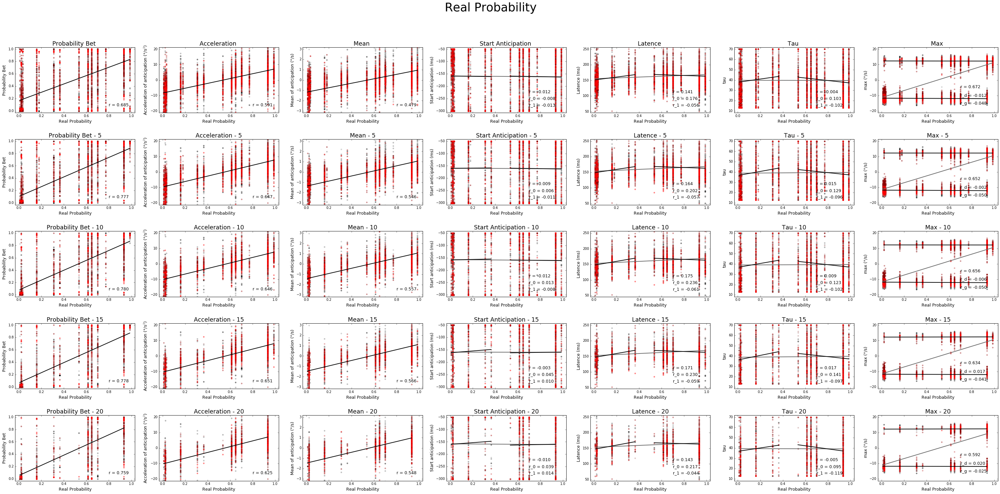

In [14]:
fig, axs = plt.subplots(nb_suppression, 7, figsize=(fig_width*7, (fig_width*nb_suppression)/1.6180))
plt.subplots_adjust(hspace=0.4)
fig.suptitle("Real Probability", fontsize=t_titre*2)

for z, comparaison in enumerate(['Probability Bet', 'Acceleration', 'Mean', 'Start Anticipation', 'Latence', 'Tau', 'Max']) :#, 'Max_G', 'Max_D']) :

    for a, nom in enumerate(liste_suppression) :
        
        proba = full_proba[a]
        proba_s = proba_sujet[a]
        
        if z == 0 :
            axs[a][z].set_ylabel('Probability Bet', fontsize=t_label)
            sujet = results_sujet[a]
            full = full_results[a]
            y_1 = -0.032
            y_2 = 1.032
        
        elif z == 1 :
            axs[a][z].set_ylabel('Acceleration of anticipation (°/s$^2$)', fontsize=t_label)
            sujet = va_sujet[a]
            full = full_va[a]
            y_1 = -21.28
            y_2 = 21.28
        
        elif z == 2 :
            axs[a][z].set_ylabel('Mean of anticipation (°/s)', fontsize=t_label)
            sujet = mean_sujet[a]
            full = full_mean[a]
            y_1 = -3.192
            y_2 = 3.192
            
            # masque les NAN
            proba = np.ma.masked_array(proba, mask=np.isnan(full)).compressed()
            full = np.ma.masked_array(full, mask=np.isnan(full)).compressed()
        
        elif z == 3 :
            axs[a][z].set_ylabel('Start anticipation (ms)', fontsize=t_label)
            sujet = start_a_sujet[a]
            full = full_start_a[a]
            y_1 = -308
            y_2 = -42
            
        elif z == 4 :
            axs[a][z].set_ylabel('Latence (ms)', fontsize=t_label)
            sujet = latence_sujet[a]
            full = full_latence[a]
            y_1 = 45.6
            y_2 = 256.4
            
        elif z == 5 :
            axs[a][z].set_ylabel('tau', fontsize=t_label)
            sujet = tau_sujet[a]
            full = full_tau[a]
            y_1 = 8.08
            y_2 = 71.92
            
        elif z == 6 :
            axs[a][z].set_ylabel('max (°/s)', fontsize=t_label)
            sujet = max_sujet[a]
            full = full_max[a]
            y_1 = -21.28
            y_2 = 21.28
            
            p_d = []
            full_d = []

            for trial in range(len(full_bino[a])) :
                if full_bino[a][trial]==1 :
                    full_d.append(full_max[a][trial])
                    p_d.append(full_proba[a][trial])
            
            p_g = []
            full_g = []

            for trial in range(len(full_bino[a])) :
                if full_bino[a][trial]==0 :
                    full_g.append(full_max[a][trial])
                    p_g.append(full_proba[a][trial])
            

        
        for x, color in enumerate(colors[:len(proba_sujet[0])]):
            axs[a][z].scatter(proba_s[x], sujet[x], c=color, alpha=0.5, linewidths=0)
        
        
        if z in [3,4,5] :
            proba_0 = []
            proba_1 = []
            full_0 = []
            full_1 = []

            for trial in range(len(proba)) :
                if proba[trial] < 0.5 :
                    proba_0.append(proba[trial])
                    full_0.append(full[trial])
                else :
                    proba_1.append(proba[trial])
                    full_1.append(full[trial])

            slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
            x_test = np.linspace(np.min(proba), np.max(proba), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='dimgrey', linewidth=2)
            axs[a][z].text(0.7,(y_1+3*(y_2-y_1)/10), 'r = %0.3f'%(r_value), fontsize=t_label)

            slope, intercept, r_value, p_value, std_err = stats.linregress(proba_0, full_0)
            x_test = np.linspace(np.min(proba_0), np.max(proba_0), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='k', linewidth=2)
            axs[a][z].text(0.7,y_1+2*(y_2-y_1)/10, 'r_0 = %0.3f'%(r_value), fontsize=t_label)

            slope, intercept, r_value, p_value, std_err = stats.linregress(proba_1, full_1)
            x_test = np.linspace(np.min(proba_1), np.max(proba_1), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='k', linewidth=2)
            axs[a][z].text(0.7,y_1+(y_2-y_1)/10, 'r_1 = %0.3f'%(r_value), fontsize=t_label)
        
        elif z == 6 :
            slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
            x_test = np.linspace(np.min(proba), np.max(proba), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='dimgrey', linewidth=2)
            axs[a][z].text(0.7,y_1+3*(y_2-y_1)/8, 'r = %0.3f'%(r_value), fontsize=t_label)
            
            slope, intercept, r_value, p_value, std_err = stats.linregress(p_d, full_d)
            x_test = np.linspace(np.min(p_d), np.max(p_d), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='k', linewidth=2)
            axs[a][z].text(0.7,(y_1+2*(y_2-y_1)/8), 'r_d = %0.3f'%(r_value), fontsize=t_label)

            slope, intercept, r_value, p_value, std_err = stats.linregress(p_g, full_g)
            x_test = np.linspace(np.min(p_g), np.max(p_g), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='k', linewidth=2)
            axs[a][z].text(0.7,y_1+1*(y_2-y_1)/8, 'r_g = %0.3f'%(r_value), fontsize=t_label)
        
        else :

            slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
            x_test = np.linspace(np.min(proba), np.max(proba), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='k', linewidth=2)
            axs[a][z].text(0.8,y_1+(y_2-y_1)/10, 'r = %0.3f'%(r_value), fontsize=t_label)
        
        axs[a][z].axis([-0.032, 1.032, y_1, y_2])
 
        axs[a][z].set_title("%s %s"%(comparaison, nom), fontsize=t_titre)
        axs[a][z].set_xlabel('Real Probability', fontsize=t_label)

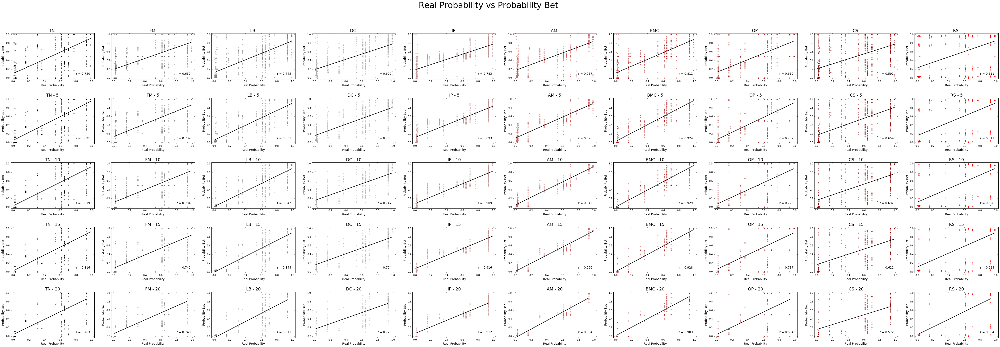

In [15]:
titre = "Real Probability vs Probability Bet"
y_1 = -0.032
y_2 = 1.032
proba = proba_sujet
para = results_sujet
x_label = 'Real Probability'
y_label = 'Probability Bet'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label)

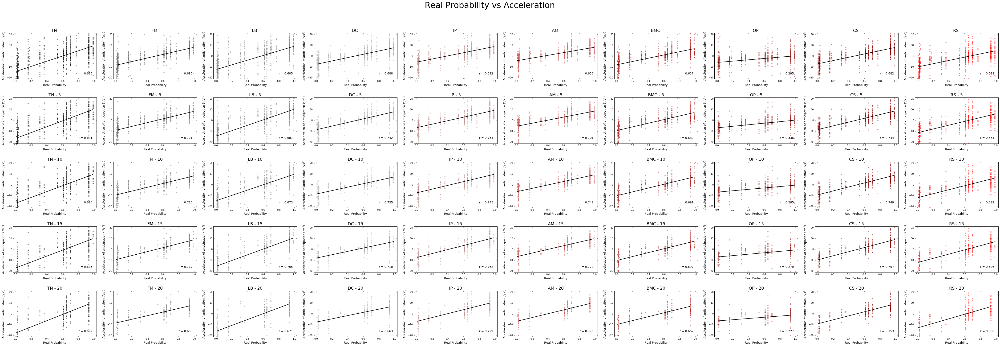

In [16]:
titre = "Real Probability vs Acceleration"
y_1 = -21.28
y_2 = 21.28
proba = proba_sujet
para = va_sujet
x_label = 'Real Probability'
y_label = 'Acceleration of anticipation (°/s$^2$)'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label)

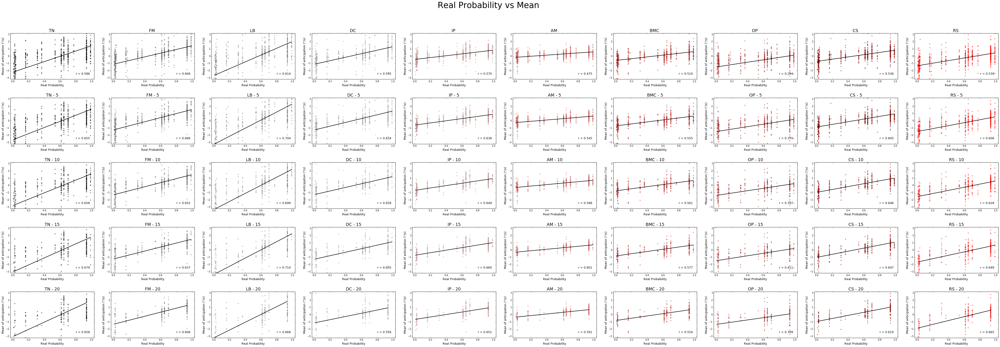

In [17]:
titre = "Real Probability vs Mean"
y_1 = -3.192
y_2 = 3.192
proba = proba_sujet
para = mean_sujet
x_label = 'Real Probability'
y_label = 'Mean of anticipation (°/s)'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label, nan=True)

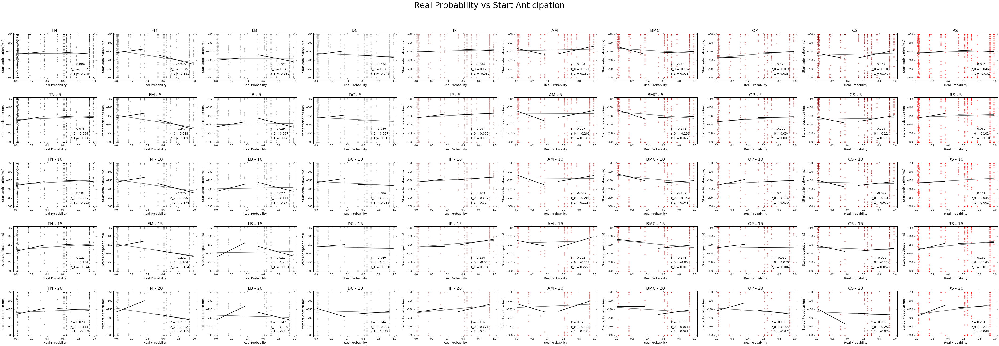

In [18]:
titre = "Real Probability vs Start Anticipation"
y_1 = -308
y_2 = -42
proba = proba_sujet
para = start_a_sujet
x_label = 'Real Probability'
y_label = 'Start anticipation (ms)'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label, deux_lignes_reg=True)

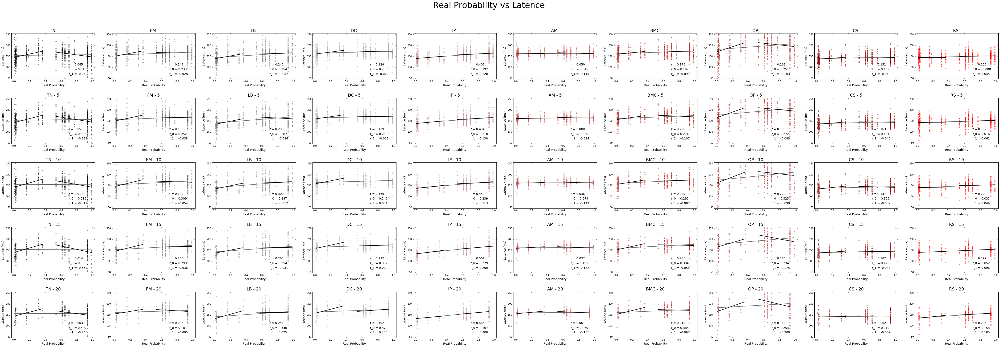

In [19]:
titre = "Real Probability vs Latence"
y_1 = 45.6
y_2 = 256.4
proba = proba_sujet
para = latence_sujet
x_label = 'Real Probability'
y_label = 'Latence (ms)'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label, deux_lignes_reg=True)

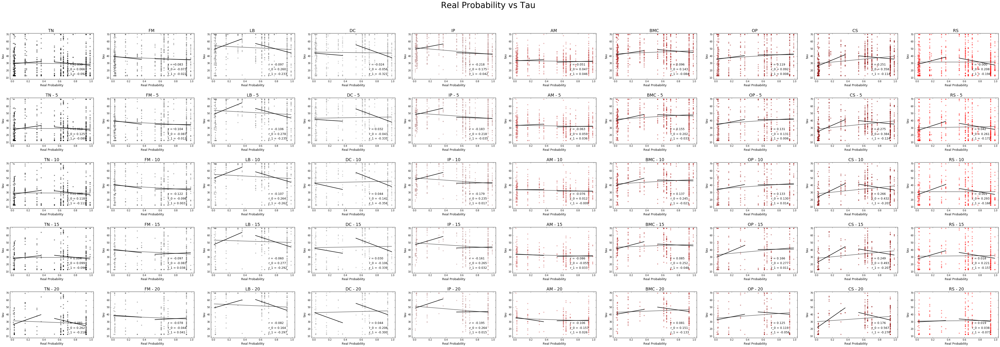

In [20]:
titre = "Real Probability vs Tau"
y_1 = 8.08
y_2 = 71.92
proba = proba_sujet
para = tau_sujet
x_label = 'Real Probability'
y_label = 'tau'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label, deux_lignes_reg=True)

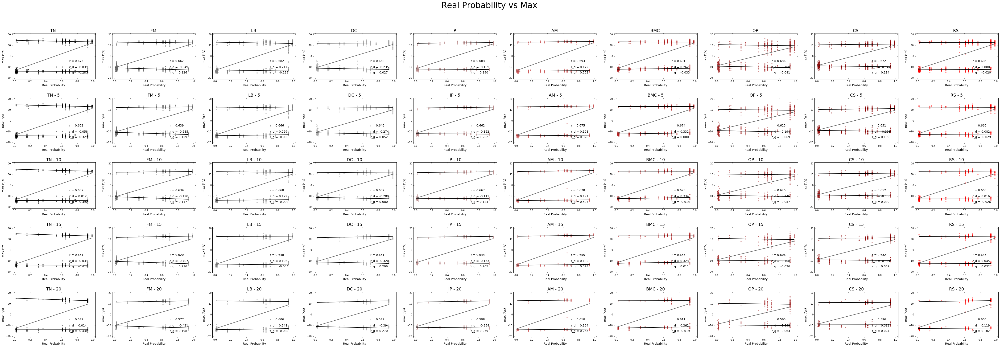

In [21]:
titre = "Real Probability vs Max"
y_1 = -21.28
y_2 = 21.28
proba = proba_sujet
para = max_sujet
x_label = 'Real Probability'
y_label = 'max (°/s)'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label)

## Probabilité parié

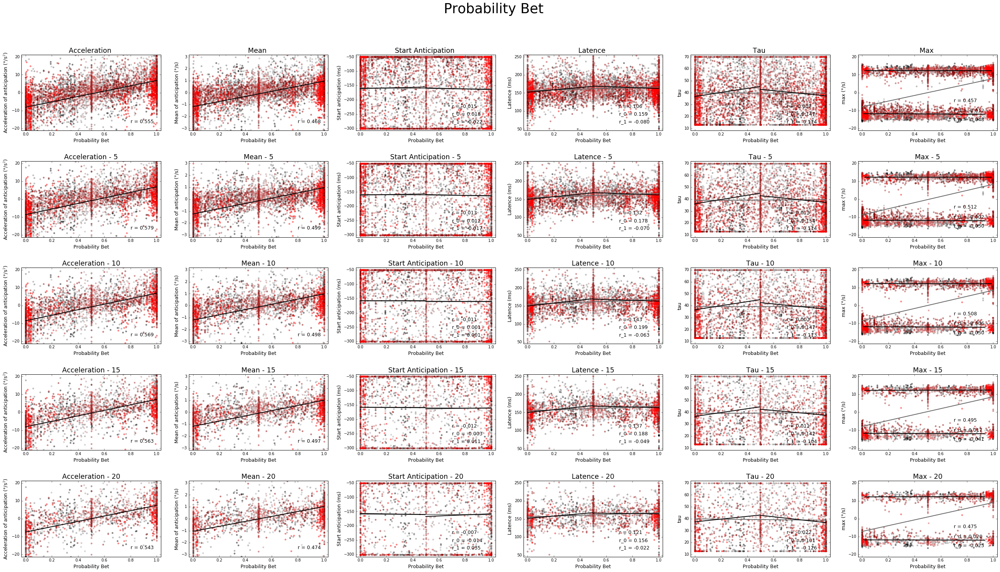

In [22]:
fig, axs = plt.subplots(nb_suppression, 6, figsize=(fig_width*6, (fig_width*nb_suppression)/1.6180))
plt.subplots_adjust(hspace=0.4)
fig.suptitle("Probability Bet", fontsize=t_titre*2)

for z, comparaison in enumerate(['Acceleration', 'Mean', 'Start Anticipation', 'Latence', 'Tau', 'Max']):#, 'Max_G', 'Max_D']) :

    for a, nom in enumerate(liste_suppression) :
        
        proba = full_results[a]
        proba_s = results_sujet[a]
        if z == 0 :
            axs[a][z].set_ylabel('Acceleration of anticipation (°/s$^2$)', fontsize=t_label)
            sujet = va_sujet[a]
            full = full_va[a]
            y_1 = -21.28
            y_2 = 21.28
        
        elif z == 1 :
            axs[a][z].set_ylabel('Mean of anticipation (°/s)', fontsize=t_label)
            sujet = mean_sujet[a]
            full = full_mean[a]
            y_1 = -3.192
            y_2 = 3.192
            
            # masque les NAN
            proba = np.ma.masked_array(proba, mask=np.isnan(full)).compressed()
            full = np.ma.masked_array(full, mask=np.isnan(full)).compressed()
        
        elif z == 2 :
            axs[a][z].set_ylabel('Start anticipation (ms)', fontsize=t_label)
            sujet = start_a_sujet[a]
            full = full_start_a[a]
            y_1 = -308
            y_2 = -42
            
        elif z == 3 :
            axs[a][z].set_ylabel('Latence (ms)', fontsize=t_label)
            sujet = latence_sujet[a]
            full = full_latence[a]
            y_1 = 45.6
            y_2 = 256.4
            
        elif z == 4 :
            axs[a][z].set_ylabel('tau', fontsize=t_label)
            sujet = tau_sujet[a]
            full = full_tau[a]
            y_1 = 8.08
            y_2 = 71.92
            
        elif z == 5 :
            axs[a][z].set_ylabel('max (°/s)', fontsize=t_label)
            sujet = max_sujet[a]
            full = full_max[a]
            y_1 = -21.28
            y_2 = 21.28
            
            p_d = []
            full_d = []

            for trial in range(len(full_bino[a])) :
                if full_bino[a][trial]==1 :
                    full_d.append(full_max[a][trial])
                    p_d.append(full_proba[a][trial])
            
            p_g = []
            full_g = []

            for trial in range(len(full_bino[a])) :
                if full_bino[a][trial]==0 :
                    full_g.append(full_max[a][trial])
                    p_g.append(full_proba[a][trial])
            
        for x, color in enumerate(colors[:nb_sujet]):
            axs[a][z].scatter(proba_s[x], sujet[x], c=color, alpha=0.5, linewidths=0)
        
        if z in [2,3,4] :
            proba_0 = []
            proba_1 = []
            full_0 = []
            full_1 = []

            for trial in range(len(proba)) :
                if proba[trial] < 0.5 :
                    proba_0.append(proba[trial])
                    full_0.append(full[trial])
                else :
                    proba_1.append(proba[trial])
                    full_1.append(full[trial])

            slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
            x_test = np.linspace(np.min(proba), np.max(proba), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='dimgrey', linewidth=2)
            axs[a][z].text(0.7,(y_1+3*(y_2-y_1)/10), 'r = %0.3f'%(r_value), fontsize=t_label)

            slope, intercept, r_value, p_value, std_err = stats.linregress(proba_0, full_0)
            x_test = np.linspace(np.min(proba_0), np.max(proba_0), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='k', linewidth=2)
            axs[a][z].text(0.7,y_1+2*(y_2-y_1)/10, 'r_0 = %0.3f'%(r_value), fontsize=t_label)

            slope, intercept, r_value, p_value, std_err = stats.linregress(proba_1, full_1)
            x_test = np.linspace(np.min(proba_1), np.max(proba_1), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='k', linewidth=2)
            axs[a][z].text(0.7,y_1+(y_2-y_1)/10, 'r_1 = %0.3f'%(r_value), fontsize=t_label)
        
        elif z == 5 :
            slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
            x_test = np.linspace(np.min(proba), np.max(proba), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='dimgrey', linewidth=2)
            axs[a][z].text(0.7,y_1+3*(y_2-y_1)/8, 'r = %0.3f'%(r_value), fontsize=t_label)
            
            slope, intercept, r_value, p_value, std_err = stats.linregress(p_d, full_d)
            x_test = np.linspace(np.min(p_d), np.max(p_d), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='k', linewidth=2)
            axs[a][z].text(0.7,(y_1+2*(y_2-y_1)/8), 'r_d = %0.3f'%(r_value), fontsize=t_label)

            slope, intercept, r_value, p_value, std_err = stats.linregress(p_g, full_g)
            x_test = np.linspace(np.min(p_g), np.max(p_g), 100)
            fitLine = slope * x_test + intercept
            axs[a][z].plot(x_test, fitLine, c='k', linewidth=2)
            axs[a][z].text(0.7,y_1+1*(y_2-y_1)/8, 'r_g = %0.3f'%(r_value), fontsize=t_label)
        
        else :
            slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
            x_test = np.linspace(np.min(proba), np.max(proba), 100)
            fitLine = slope * x_test + intercept

            axs[a][z].plot(x_test, fitLine, c='k', linewidth=2)
            axs[a][z].text(0.8,y_1+(y_2-y_1)/10, 'r = %0.3f'%(r_value), fontsize=t_label)
        
        axs[a][z].axis([-0.032, 1.032, y_1, y_2])
 
        axs[a][z].set_title("%s %s"%(comparaison, nom), fontsize=t_titre)
        axs[a][z].set_xlabel('Probability Bet', fontsize=t_label)

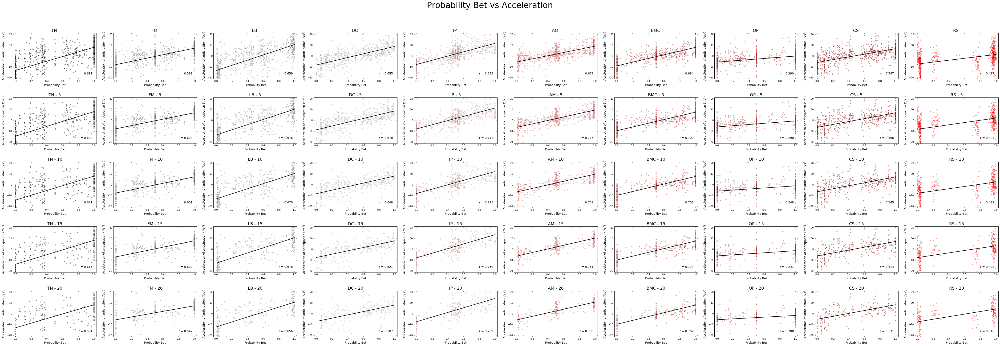

In [23]:
titre = "Probability Bet vs Acceleration"
y_1 = -21.28
y_2 = 21.28
proba = results_sujet
para = va_sujet
x_label = 'Probability Bet'
y_label = 'Acceleration of anticipation (°/s$^2$)'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label)

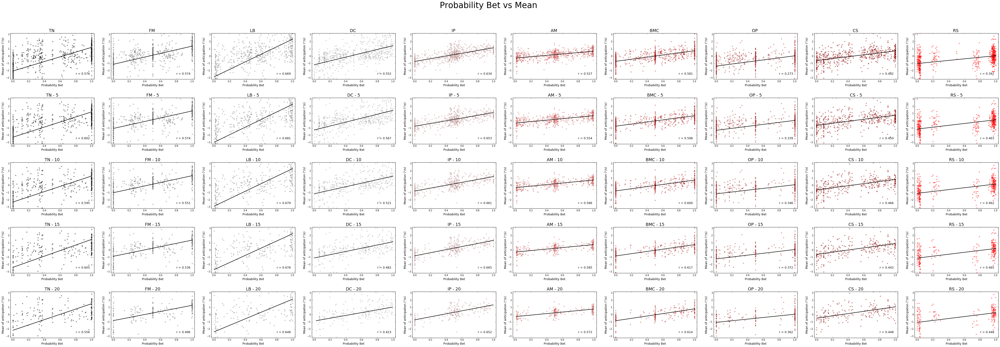

In [24]:
titre = "Probability Bet vs Mean"
y_1 = -3.192
y_2 = 3.192
proba = results_sujet
para = mean_sujet
x_label = 'Probability Bet'
y_label = 'Mean of anticipation (°/s)'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label, nan=True)

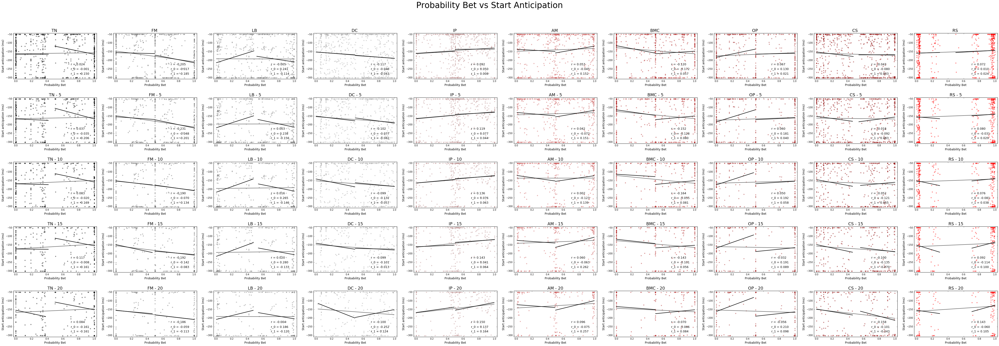

In [25]:
titre = "Probability Bet vs Start Anticipation"
y_1 = -308
y_2 = -42
proba = results_sujet
para = start_a_sujet
x_label = 'Probability Bet'
y_label = 'Start anticipation (ms)'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label, deux_lignes_reg=True)

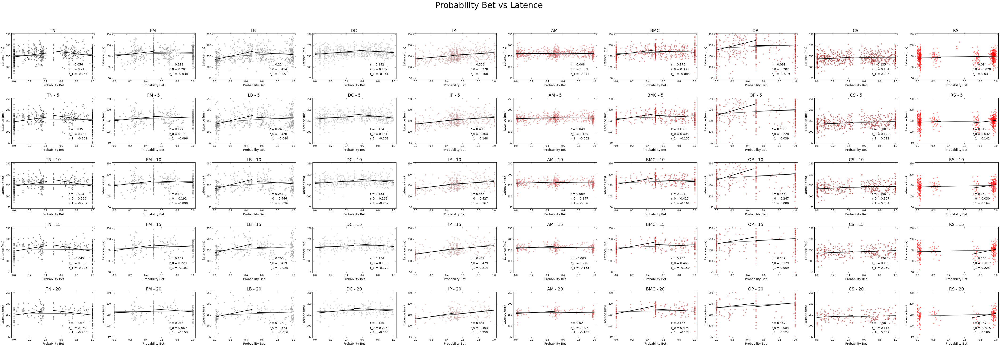

In [26]:
titre = "Probability Bet vs Latence"
y_1 = 45.6
y_2 = 256.4
proba = results_sujet
para = latence_sujet
x_label = 'Probability Bet'
y_label = 'Latence (ms)'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label, deux_lignes_reg=True)

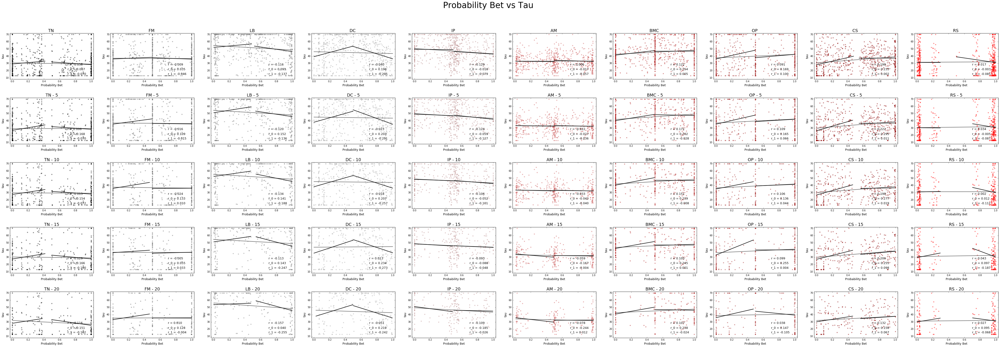

In [27]:
titre = "Probability Bet vs Tau"
y_1 = 8.08
y_2 = 71.92
proba = results_sujet
para = tau_sujet
x_label = 'Probability Bet'
y_label = 'tau'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label, deux_lignes_reg=True)

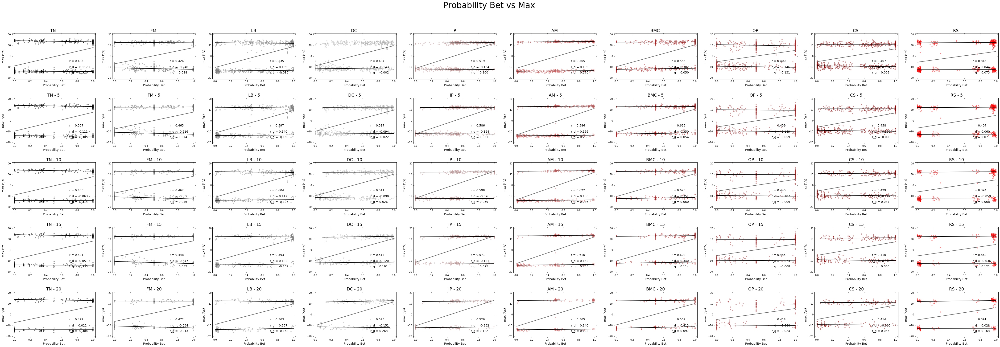

In [28]:
titre = "Probability Bet vs Max"
y_1 = -21.28
y_2 = 21.28
proba = results_sujet
para = max_sujet
x_label = 'Probability Bet'
y_label = 'max (°/s)'
plot_sujet(proba=proba, para=para, titre=titre, y_1=y_1, y_2=y_2, x_label=x_label, y_label=y_label)

## Figure pour Poster

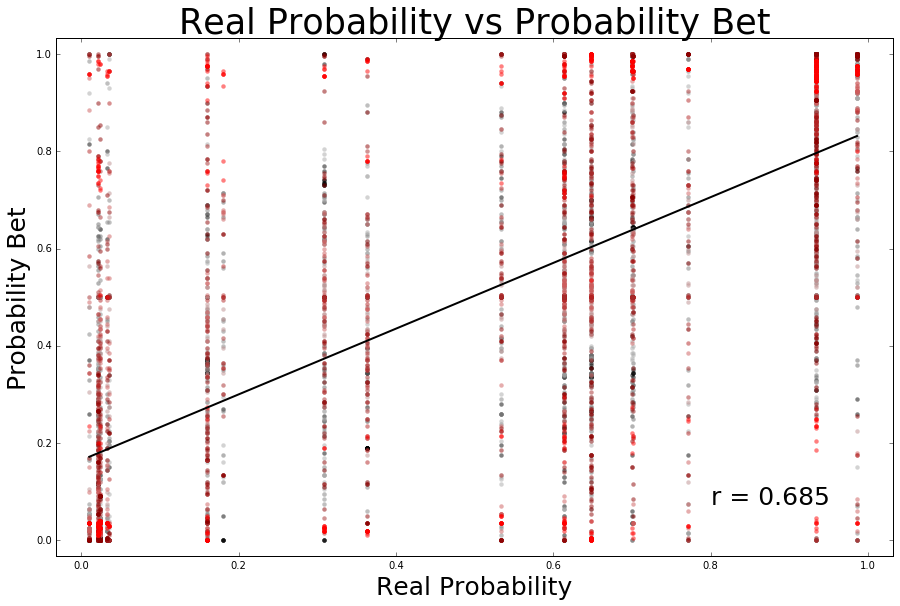

In [29]:
fig, axs = plt.subplots(1, 1, figsize=(fig_width*2, (fig_width*2)/1.6180))

proba = full_proba[0]
proba_s = proba_sujet[0]
sujet = results_sujet[0]
full = full_results[0]

y_1 = -0.032
y_2 = 1.032

for x, color in enumerate(colors[:len(proba_sujet[0])]):
    axs.scatter(proba_s[x], sujet[x], c=color, alpha=0.5, linewidths=0)
slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
x_test = np.linspace(np.min(proba), np.max(proba), 100)
fitLine = slope * x_test + intercept
axs.plot(x_test, fitLine, c='k', linewidth=2)
axs.text(0.8,y_1+(y_2-y_1)/10, 'r = %0.3f'%(r_value), fontsize=t_label*2)

axs.axis([-0.032, 1.032, y_1, y_2])

axs.set_title("Real Probability vs Probability Bet", fontsize=t_titre*2)
axs.set_xlabel('Real Probability', fontsize=t_label*2)
axs.set_ylabel('Probability Bet', fontsize=t_label*2)

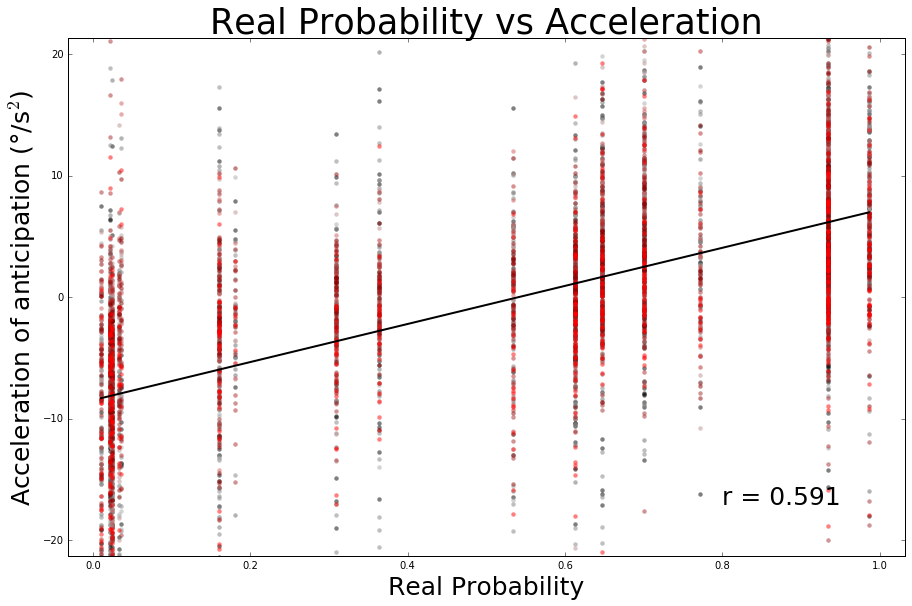

In [30]:
fig, axs = plt.subplots(1, 1, figsize=(fig_width*2, (fig_width*2)/1.6180))

proba = full_proba[0]
proba_s = proba_sujet[0]

sujet = va_sujet[0]
full = full_va[0]
y_1 = -21.28
y_2 = 21.28

for x, color in enumerate(colors[:len(proba_sujet[0])]):
    axs.scatter(proba_s[x], sujet[x], c=color, alpha=0.5, linewidths=0)


slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
x_test = np.linspace(np.min(proba), np.max(proba), 100)
fitLine = slope * x_test + intercept
axs.plot(x_test, fitLine, c='k', linewidth=2)
axs.text(0.8,y_1+(y_2-y_1)/10, 'r = %0.3f'%(r_value), fontsize=t_label*2)

axs.axis([-0.032, 1.032, y_1, y_2])

axs.set_title("Real Probability vs Acceleration", fontsize=t_titre*2)
axs.set_xlabel('Real Probability', fontsize=t_label*2)
axs.set_ylabel('Acceleration of anticipation (°/s$^2$)', fontsize=t_label*2)

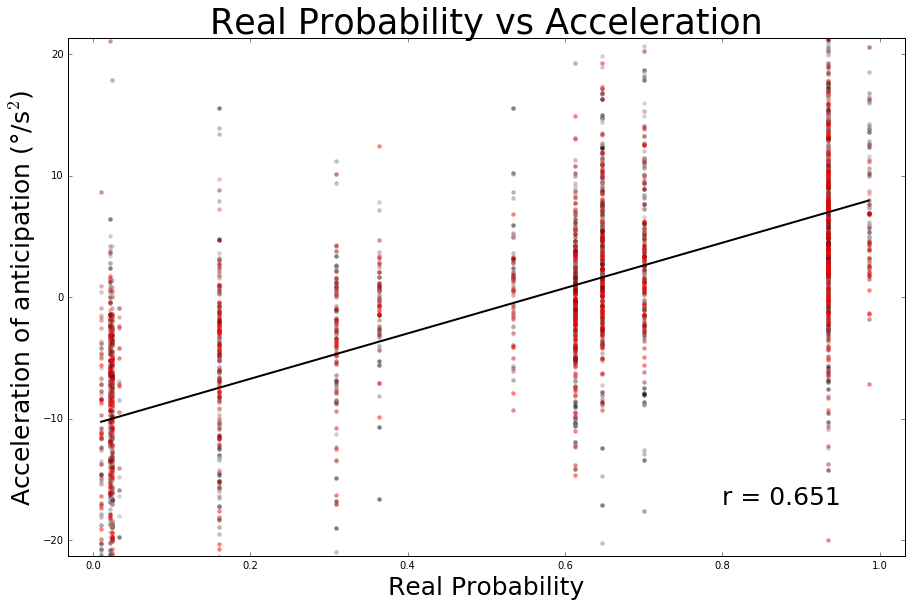

In [31]:
fig, axs = plt.subplots(1, 1, figsize=(fig_width*2, (fig_width*2)/1.6180))

proba = full_proba[3]
proba_s = proba_sujet[3]

sujet = va_sujet[3]
full = full_va[3]
y_1 = -21.28
y_2 = 21.28

for x, color in enumerate(colors[:len(proba_sujet[0])]):
    axs.scatter(proba_s[x], sujet[x], c=color, alpha=0.5, linewidths=0)


slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
x_test = np.linspace(np.min(proba), np.max(proba), 100)
fitLine = slope * x_test + intercept
axs.plot(x_test, fitLine, c='k', linewidth=2)
axs.text(0.8,y_1+(y_2-y_1)/10, 'r = %0.3f'%(r_value), fontsize=t_label*2)

axs.axis([-0.032, 1.032, y_1, y_2])

axs.set_title("Real Probability vs Acceleration", fontsize=t_titre*2)
axs.set_xlabel('Real Probability', fontsize=t_label*2)
axs.set_ylabel('Acceleration of anticipation (°/s$^2$)', fontsize=t_label*2)

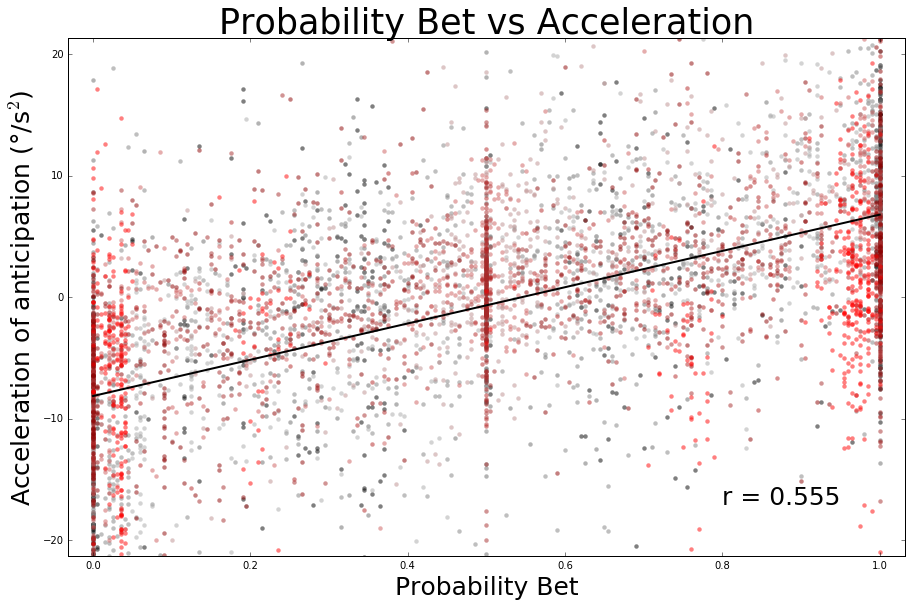

In [32]:
fig, axs = plt.subplots(1, 1, figsize=(fig_width*2, (fig_width*2)/1.6180))

proba = full_results[0]
proba_s = results_sujet[0]
sujet = va_sujet[0]
full = full_va[0]

y_1 = -21.28
y_2 = 21.28

for x, color in enumerate(colors[:len(proba_sujet[0])]):
    axs.scatter(proba_s[x], sujet[x], c=color, alpha=0.5, linewidths=0)


slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
x_test = np.linspace(np.min(proba), np.max(proba), 100)
fitLine = slope * x_test + intercept

axs.plot(x_test, fitLine, c='k', linewidth=2)
axs.text(0.8,y_1+(y_2-y_1)/10, 'r = %0.3f'%(r_value), fontsize=t_label*2)

axs.axis([-0.032, 1.032, y_1, y_2])

axs.set_title("Probability Bet vs Acceleration", fontsize=t_titre*2)
axs.set_xlabel('Probability Bet', fontsize=t_label*2)
axs.set_ylabel('Acceleration of anticipation (°/s$^2$)', fontsize=t_label*2)


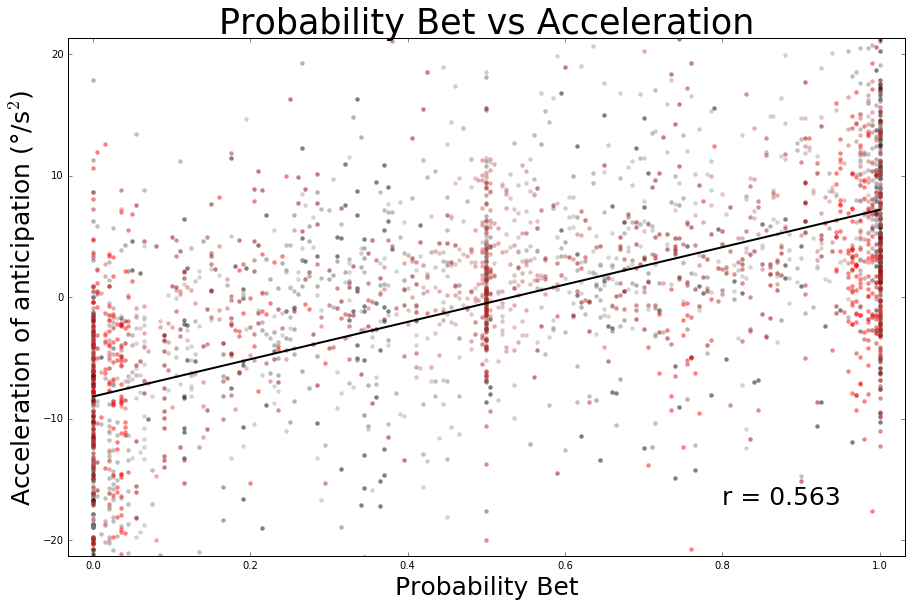

In [33]:
fig, axs = plt.subplots(1, 1, figsize=(fig_width*2, (fig_width*2)/1.6180))

proba = full_results[3]
proba_s = results_sujet[3]
sujet = va_sujet[3]
full = full_va[3]

y_1 = -21.28
y_2 = 21.28

for x, color in enumerate(colors[:len(proba_sujet[0])]):
    axs.scatter(proba_s[x], sujet[x], c=color, alpha=0.5, linewidths=0)


slope, intercept, r_value, p_value, std_err = stats.linregress(proba, full)
x_test = np.linspace(np.min(proba), np.max(proba), 100)
fitLine = slope * x_test + intercept

axs.plot(x_test, fitLine, c='k', linewidth=2)
axs.text(0.8,y_1+(y_2-y_1)/10, 'r = %0.3f'%(r_value), fontsize=t_label*2)

axs.axis([-0.032, 1.032, y_1, y_2])

axs.set_title("Probability Bet vs Acceleration", fontsize=t_titre*2)
axs.set_xlabel('Probability Bet', fontsize=t_label*2)
axs.set_ylabel('Acceleration of anticipation (°/s$^2$)', fontsize=t_label*2)